In [ ]:
#DESCOMPACTAR ARQUIVO !unzip "/content/drive/MyDrive/Dog-Vision/file.zip"
#DESCOMPACTAR ARQUIVO !unzip "drive/MyDrive/Dog-Vision/file.zip" -d "Drive/MyDrive/Dog-Vision"

## END-TO-END MULTICLASS  DOG BREED CLASSIFICATION

##1. Problem:
identifying the breed of a given image of a dog. When i'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is

##2. Data:
https://www.kaggle.com/c/dog-breed-identification

##3. Evaluation:
the evaluation is a file with predicts probabilities for each dog breed of each test image

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

##4. Features:
some informations about the data:
* images (unstructed data). So it's best we use deep learning/transfer learning

* there're 120 breeds of dogs (this means there are 120 classes)

* there're 10k+ images in training set (there are labels) and 10k+ in test set (there are no labels).



## GET WORKSPACE READY


In [ ]:
## import tools

import pandas as pd
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub  #run things on the GPU

print(f'TF Version is: {tf.__version__}')
print(f'TF HUB Version is: {hub.__version__}')
print('GPU', 'avaible' if tf.config.list_physical_devices else 'not avaible')

TF Version is: 2.6.0
TF HUB Version is: 0.12.0
GPU avaible


In [ ]:
## getting the data ready

labels_csv = pd.read_csv('/content/drive/MyDrive/datasets/courses/Dog-Vision/labels.csv')

print('Data')
print(labels_csv.head())
print('\n\n\n')
print('Describing data')
print(labels_csv.describe())

Data
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever




Describing data
                                      id               breed
count                              10222               10222
unique                             10222                 120
top     b279dd6df6740a08aa98ea68cce2396b  scottish_deerhound
freq                                   1                 126


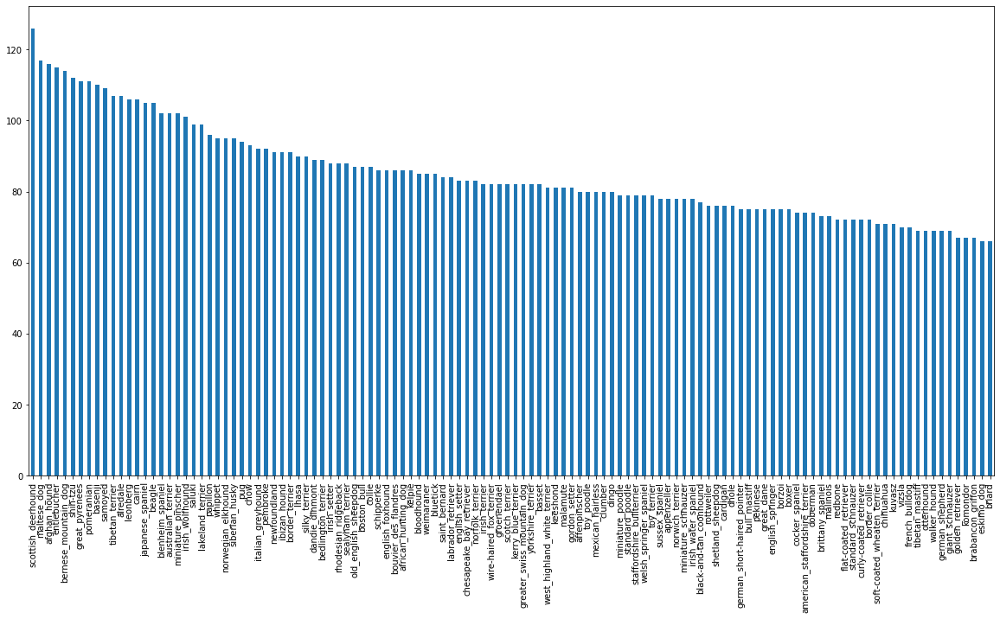

In [ ]:
## for each label, you must have at least 10 different images. But the recommended is 100 different images to training

labels_csv['breed'].value_counts().plot.bar(figsize = (20,10))


In [ ]:
## mean and median number of images per class
print(labels_csv['breed'].value_counts().median())
print(labels_csv['breed'].value_counts().mean())

82.0
85.18333333333334


## VIEW IMAGES

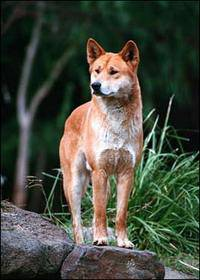

In [ ]:
#view an image
from IPython.display import Image

Image("drive/MyDrive/datasets/courses/Dog-Vision/train/00a338a92e4e7bf543340dc849230e75.jpg")

In [ ]:
## create pathnames from image ID's

filenames = ['drive/MyDrive//datasets/courses/Dog-Vision/train/' + fname + '.jpg' for fname in labels_csv['id']]
filenames[:10]

['drive/MyDrive//datasets/courses/Dog-Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive//datasets/courses/Dog-Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive//datasets/courses/Dog-Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive//datasets/courses/Dog-Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive//datasets/courses/Dog-Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive//datasets/courses/Dog-Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive//datasets/courses/Dog-Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive//datasets/courses/Dog-Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive//datasets/courses/Dog-Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive//datasets/courses/Dog-Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
import os

os.listdir('drive/MyDrive//datasets/courses/Dog-Vision/train/')[:10]

['e7af30693df78697b8541fb5e2e46941.jpg',
 'e7f2f67cb616281a89fc77a6bdea6eb0.jpg',
 'e7ab74acdc860dfb93271901da085ffd.jpg',
 'e7f3274adaad369068602a422e9df192.jpg',
 'e7faa5748d8320f604aeb3fd5bbe4ab0.jpg',
 'e7c5692d044250d303a839d989132bf1.jpg',
 'e7f491cb903ff0a294eb63c625ef090e.jpg',
 'e8013a8357f9eec2369ee4e3fab710a1.jpg',
 'e7ab11f849e895ced3cdddf4d90e5bd2.jpg',
 'e7a8a3681524405b2e987ffbaff6d173.jpg']

In [ ]:
## check whether number of filenames matches of actual images files
import os

if len(os.listdir('drive/MyDrive//datasets/courses/Dog-Vision/train/')) == len(filenames):
  print('Filenames match actual amount of files!')
else:
  print("Filenames do not match actual amount of files! Check the target directory")

Filenames match actual amount of files!


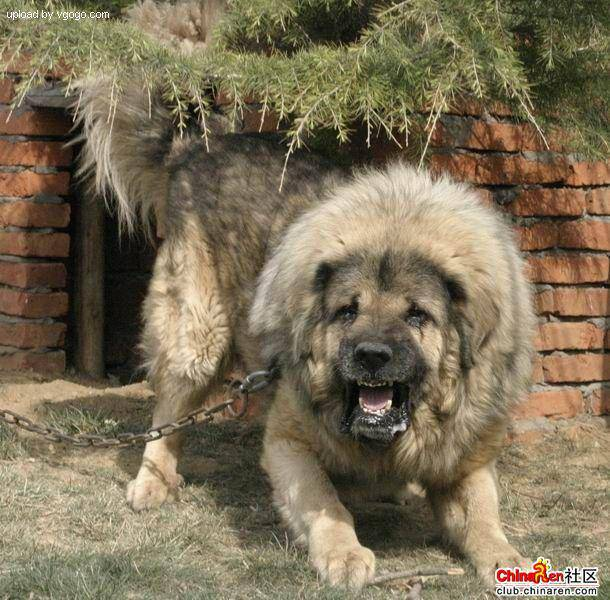

In [ ]:
## One more check

Image(filenames[9000])
#print(labels_csv['breed'][9000])

## TURN DATA INTO NUMBERS

In [ ]:
labels = labels_csv['breed']
print("LABELS IN A DATAFRAME")
print(labels.head())
print('\n\n')

labels = np.array(labels)
print("LABELS IN A NP ARRAY")
print(labels)
print('\n\n')

print(f'The numbers of itens in the array is {len(labels)}')
if len(labels) == len(filenames):
  print("Number of labels match with number of filenames")
else:
  print("Number of labels do not match with number of filanames! Check data directories")


print("\n\n")


'''
other what to do the same thing:
  labels = labels_csv['breed'].to_numpy()
'''

LABELS IN A DATAFRAME
0         boston_bull
1               dingo
2            pekinese
3            bluetick
4    golden_retriever
Name: breed, dtype: object



LABELS IN A NP ARRAY
['boston_bull' 'dingo' 'pekinese' ... 'airedale' 'miniature_pinscher'
 'chesapeake_bay_retriever']



The numbers of itens in the array is 10222
Number of labels match with number of filenames





"\nother what to do the same thing:\n  labels = labels_csv['breed'].to_numpy()\n"

In [ ]:
## Finding unique labels in array

unique_breeds = np.unique(labels)
print("Unique breeds")
print(unique_breeds)
print("\n\n")
print("Length of unique breeds")
print(len(unique_breeds))

Unique breeds
['affenpinscher' 'afghan_hound' 'african_hunting_dog' 'airedale'
 'american_staffordshire_terrier' 'appenzeller' 'australian_terrier'
 'basenji' 'basset' 'beagle' 'bedlington_terrier' 'bernese_mountain_dog'
 'black-and-tan_coonhound' 'blenheim_spaniel' 'bloodhound' 'bluetick'
 'border_collie' 'border_terrier' 'borzoi' 'boston_bull'
 'bouvier_des_flandres' 'boxer' 'brabancon_griffon' 'briard'
 'brittany_spaniel' 'bull_mastiff' 'cairn' 'cardigan'
 'chesapeake_bay_retriever' 'chihuahua' 'chow' 'clumber' 'cocker_spaniel'
 'collie' 'curly-coated_retriever' 'dandie_dinmont' 'dhole' 'dingo'
 'doberman' 'english_foxhound' 'english_setter' 'english_springer'
 'entlebucher' 'eskimo_dog' 'flat-coated_retriever' 'french_bulldog'
 'german_shepherd' 'german_short-haired_pointer' 'giant_schnauzer'
 'golden_retriever' 'gordon_setter' 'great_dane' 'great_pyrenees'
 'greater_swiss_mountain_dog' 'groenendael' 'ibizan_hound' 'irish_setter'
 'irish_terrier' 'irish_water_spaniel' 'irish_wolfho

In [ ]:
 ## Turn a single label into an array of booleans
 print(labels[0])
 print(labels[0] == unique_breeds)

 print("\n\n")


 #Turn every label into a boolean array
 boolean_labels = [label == unique_breeds for label in labels]
 print(boolean_labels[:2])

 print("\n\n")
 print("Size of boolean labels")
 len(boolean_labels)



boston_bull
[False False False False False False False False False False False False
 False False False False False False False  True False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False]



[array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, F

10222

In [ ]:
## Turning boolean arrays into integers

print(labels[0]) #original
print(np.where(unique_breeds == labels[0])) #index where label occurs
print(boolean_labels[0].argmax()) #index where label occurs in boolean array
print(boolean_labels[0].astype(int)) #there will be a 1 where the sample label occurs


print("\n\n")


print(labels[2])
print(boolean_labels[2].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]



pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


## CREATING OUR OWN VALIDATION SET

In [ ]:
## setup x and y

x = filenames
y = boolean_labels

In [ ]:
## starting with ~1000 and increase as needed

                  #magic trick
num_images = 1000 #@param {type:'slider', min:1000, max:10000, step:1000}

In [ ]:
## split the data into train and test
from sklearn.model_selection import train_test_split

x_train, x_val, y_train, y_val = train_test_split(x[ : num_images], y[ :num_images], test_size = 0.2, random_state = 42)

print(f'x_train: {len(x_train)}\nx_val: {len(x_val)}\ny_train: {len(y_train)}\ny_val: {len(y_val)}')
print(f'\n\nX_TRAIN\n{x_train[:2]}\n\nY_TRAIN\n{y_train[:2]}')

x_train: 800
x_val: 200
y_train: 800
y_val: 200


X_TRAIN
['drive/MyDrive//datasets/courses/Dog-Vision/train/00bee065dcec471f26394855c5c2f3de.jpg', 'drive/MyDrive//datasets/courses/Dog-Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg']

Y_TRAIN
[array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False,  True,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, Fals

## PREPROCESSING IMAGES: TURNING IMAGES INTO TENSORS (MATRIX)

Writte a function witch does these things:
* Take an filepath as input
* Use TensorFlow to read the file and save it to a variable image
* Turn our image (jpg) into Tensors
* Normalize our image (convert color channel from 0-255 to 0-1)
* Resize the images to be a shape of (224, 224)
* Return the modified image


In [ ]:
## convert to a numpy array
from matplotlib.pyplot import imread

image = imread(filenames[42])
print(f'{image.shape}\n\n') #heigth, widhth, color (RGB)
print(image[0:2])

(257, 350, 3)


[[[ 89 137  87]
  [ 76 124  74]
  [ 63 111  59]
  ...
  [ 76 134  86]
  [ 76 134  86]
  [ 76 134  86]]

 [[ 72 119  73]
  [ 67 114  68]
  [ 63 111  63]
  ...
  [ 75 131  84]
  [ 74 132  84]
  [ 74 131  86]]]


In [ ]:
## Turning the array into a tensor

tf.constant(image)[0:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

In [ ]:
## making the glorious function

IMG_SIZE = 224

def process_image(image_path, img_size = IMG_SIZE):
  '''
  Takes an image file path and turns the image into a Tensor
  '''
  #Read an image file
  image = tf.io.read_file(image_path)

  #Turn the jpeg image into numerical Tensors with 3 color channels (RGB)
  image = tf.image.decode_jpeg(image, channels=3)

  #Convert the color channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)

  #Resize the image to our desired value (244, 244)
  image = tf.image.resize(image, size = [IMG_SIZE, IMG_SIZE])

  return image


In [ ]:
## Testing the steps
'''

tensor = tf.io.read_file(filenames[21])
print(tensor)
print('\n\n')
tensor = tf.image.decode_jpeg(tensor, channels=3)
print(tensor)
print('\n\n')
tensor = tf.image.convert_image_dtype(tensor, tf.float32)
print(tensor)
print('\n\n')

'''

"\n\ntensor = tf.io.read_file(filenames[21])\nprint(tensor)\nprint('\n\n')\ntensor = tf.image.decode_jpeg(tensor, channels=3)\nprint(tensor)\nprint('\n\n')\ntensor = tf.image.convert_image_dtype(tensor, tf.float32)\nprint(tensor)\nprint('\n\n')\n\n"

## TURNING OUR DATA INTO BATCHES

Batches is a small portion (usually 32) of your images. We use these to calculate these portion each loop (training session), not everything once. 32 Images is helthy for your memory.


We need out data in the form of Tensor tuples (image, label).

In [ ]:
## Create a function to return a tuple (image, label)

def get_image_label(image_path, label):
  '''
  Take an image file path name and the associated label, processes the image and
  returns a tupple of (image, label)
  '''
  image = process_image(image_path=image_path)
  return image, label

In [ ]:
(process_image(x[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
## Making batches

BATCH_SIZE = 32

## Create a function to turn data into beaches
def create_data_batches(x, y = None, batch_size = BATCH_SIZE, valid_data = False, test_data = False):
  '''
  Creates batches of data out of image X and label Y pairs. It shuffles the data  if's training
  data but doesn't shuffle if it's validation data.

  Also accepts test data as input (no labels).
  '''

  ## If data is a test dataset, we probably don't have labels
  if test_data: #test_data is not None
    print('Creating test data batches')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) #cria um dataset de um tensor (no label)
    data_batch = data.map(process_image).batch(BATCH_SIZE) #processa a imagem e transforma ela em um batch
    return data_batch

  ## If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print('Creating validation data batches') #filepath         #labels
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches")
    ## Turn filepaths and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))

    ## Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size = len(x))

    ## Create (image, label) tupple (this also turns the image path into a processed image)
    data = data.map(get_image_label)

    ## Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
    return data_batch



In [ ]:
## Creating a training and validation data batches

train_data = create_data_batches(x_train, y_train)
val_data = create_data_batches(x_val, y_val, valid_data = True)

Creating training data batches
Creating validation data batches


In [ ]:
## Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
## Visualizing data batches

import matplotlib.pyplot as plt

## Create a function for viewing images in a data batch
def show_25_images(images, labels):
  '''
  Display a plot of 25 images and their labels from a data batch
  '''

  ## Setup the figure
  plt.figure(figsize=(12,12))

  ## Loop through 25
  for i in range(25):
    ## Create a subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1) #column, row, index
    ## Display an image
    plt.imshow(images[i])
    ## Add the image label as the tittle
    plt.title(unique_breeds[labels[i].argmax()])
    ## Turn the gridlines off
    plt.axis('off')

In [ ]:
## Transforming the batches into an iterator using as_numpy_iterator
'''
train_images, train_labels = next(train_data.as_numpy_iterator())

print(len(train_images))
print(len(train_labels))
'''

'\ntrain_images, train_labels = next(train_data.as_numpy_iterator())\n\nprint(len(train_images))\nprint(len(train_labels))\n'

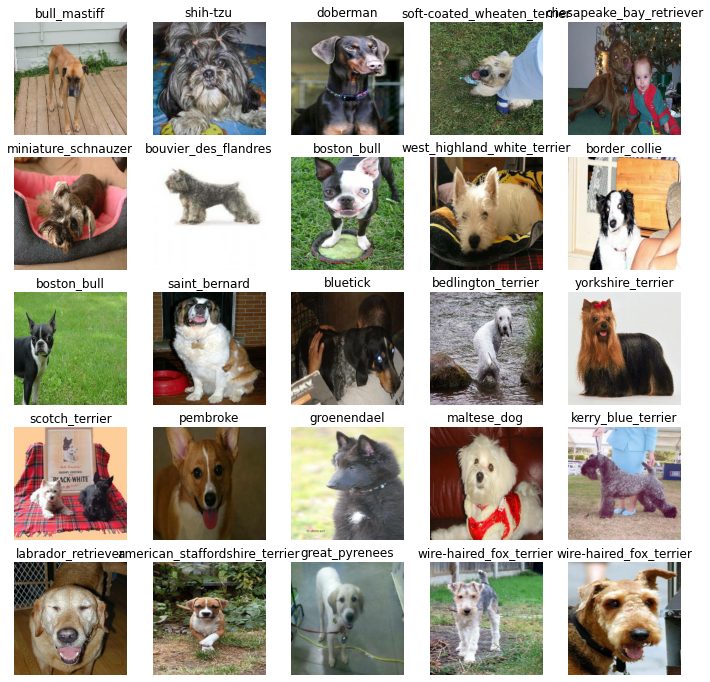

In [ ]:
## Transforming the batches into an iterator using as_numpy_iterator
train_images, train_labels = next(train_data.as_numpy_iterator())

## Visualize the data in a training batch
show_25_images(train_images, train_labels)

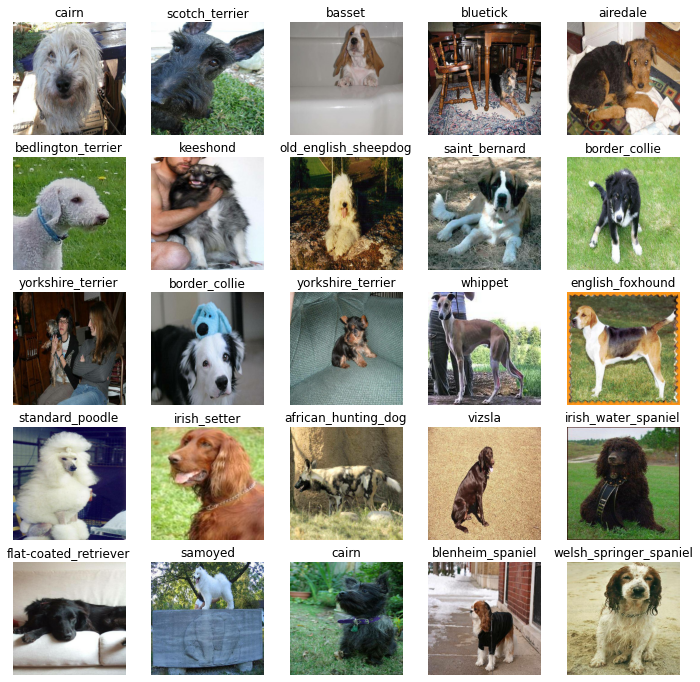

In [ ]:
## Doing the same thing, but with our validation data

## Transforming the batches into an iterator using as_numpy_iterator
val_images, val_labels = next(val_data.as_numpy_iterator())

## Visualize the data in a training batch
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of tensors) to our model.
* The output shape (our image labels, in the form of tensors) of our model.
* The URL of the model we want to use from TensorFlow HUB https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [ ]:
## Setup input shape to the model
#IMG_SIZE = 224
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]   #batch, height, width, color channels

## Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

## Setup model URL from tensorflow hub
MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5'

'''
Keras is a Tensor Flow's API to training deep learning models
'''



"\nKeras is a Tensor Flow's API to training deep learning models\n"

## CREATING A FUNCTION TO PUT THE INPUT, OUTPUT AND THE MODEL INTO THE KERAS

The function have to:
* Takes the input shape, output shape and the model we've choose as paramethers
* Defines the layers in a Keras Model in a sequentional fashion (do this first then this, then that...)
* Compiles the model (says it should be evaluated and improved)
* Builds the model (tells the model the input shape it'll be getting)
* Returns the model

All of theses steps can be found here: https://www.tensorflow.org/guide/keras/sequential_model

In [ ]:
## Creating a function that build an keras model

def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  print('Building model with:', MODEL_URL)

  #Setup the model layers
  model = tf.keras.Sequential([
                               hub.KerasLayer(MODEL_URL), #layer 1 (input layer)
                               tf.keras.layers.Dense(units = OUTPUT_SHAPE,
                                                     activation = 'softmax'), #layer 2 (output layer)
                              ])

  ## Compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ['accuracy']
  )

  ## Build the model
  model.build(INPUT_SHAPE)

  return model



'''
Trying to understand what is going on:

keras.Sequencional() is a stack of layers that is going to take some sort of input, find patterns
and then have some sort of output.
    The first layer is the URL of the model. We're chosing what model we are going to use to receive the input.
    The dense layer is to get the output in the shape we want. The softmax convert the numbers into numbers between 0 or 1

The compile:
  the loss is a measure of when our model is learning. We want to minimize the loss, gettint it to 0
      BINARY CLASSIFICATION: activation = Sigmoid, Loss = Binarycrossentropy
      MULTICLASS CLASSIFICATION: activation = softmax, loss = categorical crossentropy

  otimizer is a way to optimize your model
      Adam's performs well in the most of models

  the metrics accuracy is how well your model is predicting the correct image label


Building:
  Builds the model with the configuration we used

'''


"\nTrying to understand what is going on:\n\nkeras.Sequencional() is a stack of layers that is going to take some sort of input, find patterns\nand then have some sort of output.\n    The first layer is the URL of the model. We're chosing what model we are going to use to receive the input.\n    The dense layer is to get the output in the shape we want. The softmax convert the numbers into numbers between 0 or 1\n\nThe compile:\n  the loss is a measure of when our model is learning. We want to minimize the loss, gettint it to 0\n      BINARY CLASSIFICATION: activation = Sigmoid, Loss = Binarycrossentropy\n      MULTICLASS CLASSIFICATION: activation = softmax, loss = categorical crossentropy\n\n  otimizer is a way to optimize your model\n      Adam's performs well in the most of models\n\n  the metrics accuracy is how well your model is predicting the correct image label\n\n\nBuilding:\n  Builds the model with the configuration we used\n\n"

In [ ]:
model = create_model()
model.summary()


'''
Summary:
  Params: these are the images that the model was trained in the imagenet website
  Dense: the patterns founded that we can use in our problem

'''

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              5432713   
_________________________________________________________________
dense (Dense)                (None, 120)               120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


'\nSummary:\n  Params: these are the images that the model was trained in the imagenet website\n  Dense: the patterns founded that we can use in our problem\n\n'

## Create callbacks

Callback is a function that the model can use during training to do such things as
save its progress, check its progress or stop training early if a model stops improving

I'm creating two callbacks. One for tensorboard witch helps to track our model progress and another for early stopping which prevents the model from training for too long.



## Tensorboard callback

To setup a tensorboard, we need to do 3 things:
* Load the tensorboard notebook extension
* Create a tensorboard callback wich is able to save logs to a directory and pass it to our model's fit() function.
* Visualize out model's training logs with %tensorboard function (after training)


## Early stopping callback

Early stopping helps to the model from overfitting by stopping training if a certain evaluation metric stops
improving

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping
[link text](https://)


In [ ]:
## Tensorboard callback

## Load TensorBoard notebook extesion
%load_ext tensorboard


In [ ]:
import datetime

## Create a function to build a tensorboard callback
def create_tensorboard_callback():

  ## Create a log directory for storing tensorboard logs
  logdir = os.path.join('drive/MyDrive/datasets/courses/Dog-Vision/logs',
                        datetime.datetime.now().strftime('%d%m%Y-%H%M%S'))  ## Make it so the logs get tracked whenever we run an experiment
  return tf.keras.callbacks.TensorBoard(logdir)


'''
This function is creating log files in a new file. These log files are in the time that we run
the experiment.
'''

'\nThis function is creating log files in a new file. These log files are in the time that we run\nthe experiment.\n'

In [ ]:
## Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = 'val_accuracy',
                                                  patience = 3)


'''
Val accuracy is the metric we want to look and patience is the number of epochs with no improvments
after wich training will be stopped.

The number of epochs is how many passes of the data we'd like our model to do. And a pass is you can imagine
is equivalent to the model trying to find patterns in each dog image and see which patterns relate to
each label.

1 epoch is like to giving a model a single chance to look at all the training data and them validating it from there.
100 epoch is giving a model 100 chances to go through the training data and figure out the patterns
'''


"\nVal accuracy is the metric we want to look and patience is the number of epochs with no improvments\nafter wich training will be stopped.\n\nThe number of epochs is how many passes of the data we'd like our model to do. And a pass is you can imagine\nis equivalent to the model trying to find patterns in each dog image and see which patterns relate to\neach label.\n\n1 epoch is like to giving a model a single chance to look at all the training data and them validating it from there.\n100 epoch is giving a model 100 chances to go through the training data and figure out the patterns\n"

## Training a model (on subset data)

The model is going to train on 1000 images, just to make sure everything is working


To create a function which trains a model, we are going to need:
* Create a model using create_model()
* Setup a tensorboard callback using create_tensorboard_callback()
* Call the fit() function passing it the training data, validation data, number of epochs to train (NUM_EPOCHS)
* Return the model

In [ ]:
## Training a model (on subset data)

NUM_EPOCHS = 100 #@param {type:'slider', min:10, max:100, step:10}

In [ ]:
## Check to make sure we're still running on a GPU
print('GPU', 'available' if tf.config.list_physical_devices("GPU") else 'not available')

GPU not available


In [ ]:
## Build a function to train and return a trained model

def train_model():
  '''
  Train a given model and returns the trained version
  '''

  ## Create model
  model = create_model()

  ## Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  ## Fit the model to the data passing it the callbacks created
  model.fit(x = train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq = 1,
            callbacks = [tensorboard, early_stopping])

  return model



'''
x = train data (contains the image and labels)
epochs = num_epochs (how many times the model is allowed to look at the training data before it stops,
                      or how many chances the model have to pass over the entire training dataset to find patterns)

validation_frequencies = how often we want to test the patterns that the model has found on the validation set
'''

'\nx = train data (contains the image and labels)\nepochs = num_epochs (how many times the model is allowed to look at the training data before it stops,\n                      or how many chances the model have to pass over the entire training dataset to find patterns)\n\nvalidation_frequencies = how often we want to test the patterns that the model has found on the validation set\n'

In [ ]:
## Fit the model to the data

model = train_model()

'''
The model is overfitting because its performing much better on the training dataset than the validation dataset, what are some ways to prevent model
overfitting in deep learning neural networks?
'''

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 174s 7s/step - loss: 4.6696 - accuracy: 0.0900 - val_loss: 3.4296 - val_accuracy: 0.2700
Epoch 2/100
25/25 [==============================] - 35s 1s/step - loss: 1.6789 - accuracy: 0.6975 - val_loss: 2.1871 - val_accuracy: 0.5200
Epoch 3/100
25/25 [==============================] - 39s 2s/step - loss: 0.5857 - accuracy: 0.9413 - val_loss: 1.6613 - val_accuracy: 0.6200
Epoch 4/100
25/25 [==============================] - 38s 2s/step - loss: 0.2609 - accuracy: 0.9875 - val_loss: 1.4692 - val_accuracy: 0.6500
Epoch 5/100
25/25 [==============================] - 39s 2s/step - loss: 0.1497 - accuracy: 0.9975 - val_loss: 1.4120 - val_accuracy: 0.6800
Epoch 6/100
25/25 [==============================] - 35s 1s/step - loss: 0.1021 - accuracy: 0.9987 - val_loss: 1.3625 - val_accuracy: 0.6800
Epoch 7/100
25/25 [==============================] - 35s 1s/

'\nThe model is overfitting because its performing much better on the training dataset than the validation dataset, what are some ways to prevent model\noverfitting in deep learning neural networks?\n'

## Checking the TensorBoard logs

the tensorboard magic function (%tensorboard) will access logs directory we created earlier and visualize its contents



In [ ]:
%tensorboard --logdir drive/MyDrive/Dog-Vision/logs

'''
Use this line to check visually how well is your model performing
'''

<IPython.core.display.Javascript object>

'\nUse this line to check visually how well is your model performing\n'

## Making and evaluating predictions using a trained model

In [ ]:
 ## Make predictions on a validation data (not used to train on)
 predictions = model.predict(val_data, verbose = 1)
 print(predictions)
 print('\n\n')
 print(predictions.shape) #shape is
 print(len(y_val), len(unique_breeds))  #rows and columns
 print('\n\n')
 print(predictions[0])
 print("\n\n")
 print(np.sum(predictions[0]))


 '''
 predict() is going to look at the images in the data and then make predictions based on those images. So what
 we can do is compare those predictions which are going to be in the form of labels

 the array is a probability of what the model thinks it is. so if we sum the array a single predict array, the result
 is 1
 '''


7/7 [==============================] - 8s 961ms/step
[[5.0251582e-03 1.4124648e-04 9.7466714e-04 ... 3.9992764e-04
  7.5453892e-05 7.1163448e-03]
 [2.1761954e-03 4.3527147e-04 3.3908659e-03 ... 1.7370482e-03
  2.6297711e-03 2.4108443e-04]
 [4.9237115e-04 1.4783084e-04 1.4390290e-04 ... 3.1779641e-03
  1.0781953e-04 8.4510201e-04]
 ...
 [2.2853442e-06 2.1282613e-05 4.6521573e-06 ... 1.5744412e-05
  2.7365400e-04 5.4637603e-05]
 [3.9375434e-03 2.9097864e-04 3.2171745e-05 ... 2.2170217e-04
  2.0396609e-04 1.5414284e-02]
 [1.7596737e-03 2.0362962e-04 3.3410960e-03 ... 1.8310189e-02
  5.2851369e-04 6.0553721e-04]]



(200, 120)
200 120



[5.02515817e-03 1.41246477e-04 9.74667142e-04 1.06739288e-04
 1.96542213e-04 3.42785679e-05 6.95508579e-03 1.57016434e-03
 5.42251451e-04 2.41029134e-04 9.98631236e-04 9.44984276e-05
 2.08170241e-04 3.96717514e-05 3.29121482e-04 1.13646686e-03
 2.00677256e-04 8.22394118e-02 4.71511485e-05 1.88924139e-04
 4.27670340e-04 1.46464095e-04 7.78038593e-05 1.91119

'\npredict() is going to look at the images in the data and then make predictions based on those images. So what\nwe can do is compare those predictions which are going to be in the form of labels\n\nthe array is a probability of what the model thinks it is. so if we sum the array a single predict array, the result\nis 1\n'

In [ ]:
## First prediction

index = 5
print(predictions[index])
print('\n\n')
print(f'Max value (probability of prediction): {np.max(predictions[index])}')
print(f'sum: {np.sum(predictions[index])}')
print(f'max index: {np.argmax(predictions[index])}')
print(f'predicted label: {unique_breeds[np.argmax(predictions[index])]}')

'''
These strange matrix that we see is confidence intervals
'''

[1.44395075e-04 9.12652395e-05 3.44980741e-04 1.15844049e-02
 2.42620110e-04 1.96434426e-04 1.71517560e-04 2.01832052e-04
 3.41238570e-04 8.54877944e-05 9.10863876e-01 1.28842163e-04
 9.73456408e-05 2.00361275e-04 5.18008310e-04 2.20244774e-03
 1.91461048e-04 1.76741160e-04 4.06886684e-05 3.52987292e-04
 7.78921094e-05 1.03642669e-04 1.43367884e-04 1.70805535e-04
 6.07854105e-04 4.34604532e-04 4.70137857e-05 1.85616955e-04
 1.35765830e-03 6.95751587e-05 4.39025243e-05 1.24179618e-03
 5.01082832e-05 1.12832706e-04 3.10477056e-03 4.92239720e-04
 1.64940211e-04 1.46202103e-04 2.78255029e-04 2.18966918e-04
 1.05568783e-04 1.60093332e-04 2.15825989e-04 6.10532006e-05
 6.18025151e-05 1.54920985e-04 6.45653417e-05 8.49258155e-04
 3.55729135e-05 1.07319327e-04 1.94325839e-05 4.84723605e-05
 3.78544646e-05 1.78091344e-04 6.67803688e-05 4.59154282e-04
 5.16018539e-04 6.20821724e-04 2.22685002e-03 6.11360010e-04
 8.60240136e-04 1.85872035e-04 1.14432522e-04 5.49102197e-06
 6.92350208e-04 6.162631

'\nThese strange matrix that we see is confidence intervals\n'

### Turning predictions more visualy

Having the above functionality is great, but we want to be able to do it at scale. And it would be even better if
we could see the image the prediction is being made on!

NOTE: prediction probabilities are also know as confidence levels.

In [ ]:
## Turn prediction probabilities into to their respective label (easier to understand)

def get_pred_label(prediction_probabilities):
    '''
    Turns an array of prediction probabilities into a label.
    '''

    return unique_breeds[np.argmax(prediction_probabilities)]



## Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[42])
pred_label

'english_foxhound'

### Unbatch the dataset

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (true labels).

In [ ]:
val_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
## Create a function to unbatch a dataset
def unbatchify(data):
    '''
    Takes a batched dataset of (image, label) tensors and returns separate arrays
    of images and labels
    '''

    images = []
    labels = []

    ## Loop through unbatched data
    for image, label in data.unbatch().as_numpy_iterator():
        ## Appending each image and each label into the list
        images.append(image)
        labels.append(unique_breeds[np.argmax(label)])

    return images, labels

In [ ]:
val_images, val_labels = unbatchify(val_data)

val_images[0], val_labels[0]


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_labels[0])

'affenpinscher'

In [ ]:
get_pred_label(predictions[0])

'cairn'

### Visualizing model predictions

* Prediction labels
* Validation labels (true labels)
* Validation images

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and integers
* Convert the predictions probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and target images on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n = 1):
    '''
    View the prediction, ground truth and image for sample n
    '''
    pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

    ## Get pred label
    pred_label = get_pred_label(pred_prob)

    ## Plot image and remove ticks
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])

    ## Change the color of the title depending on if the prediction is right or wrong
    if pred_label == true_label:
        color = 'green'
    else:
        color = 'red'

    ## Change plot title to be predicted, probability of prediction and truth label
    plt.title(f'{pred_label} {np.max(pred_prob) * 100:2.0f}% {true_label}', color = color)


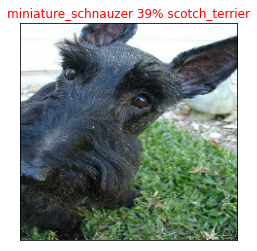

In [ ]:
plot_pred(prediction_probabilities = predictions, labels = val_labels, images = val_images)

### Visualizing the model's top 10 predictions

This function will:
* Take an input of predictions probabilities array and a ground truth array and an integer
* Find the predicted label using get_pred_label()
* Find the top 10:
    * Prediction probabilities indexes
    * Prediction probabilities values
    * Prediction labels
* Plot the top 10 prediction probability value and labels, coloring the true label green

In [ ]:
### Visualizing the model's top 10 predictions

def plot_pred_conf(prediction_probabilities, labels, n = 1):
    '''
    Plus the top 10 highest prediction confidence along with the truth label for sample n
    '''

    pred_prob, true_label = prediction_probabilities[n], labels[n]

    ## Get the predicted label
    pred_label = get_pred_label(pred_prob)

    ## Find the top 10 predictions confidence indexes
    top_10_pred_indexes = pred_prob.argsort()[-10:][::-1] ## [-10:] already shows the numbers, but [:-1] is to show in descending order

    ## Find the top 10 prediction confidence values
    top_10_pred_values = pred_prob[top_10_pred_indexes]

    ## Find the top 10 prediction labels
    top_10_pred_labels = unique_breeds[top_10_pred_indexes]

    ## Setup plot
    top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                       top_10_pred_values,
                       color = "grey")

    plt.xticks(np.arange(len(top_10_pred_labels)),
               labels = top_10_pred_labels,
               rotation = "vertical")

    ## Change the color of true label
    if np.isin(true_label, top_10_pred_labels):
        top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
    else:
        pass

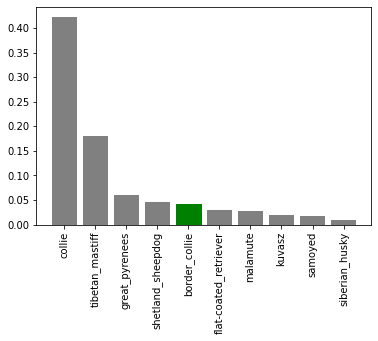

In [ ]:
plot_pred_conf(prediction_probabilities = predictions,
               labels = val_labels,
               n = 9)

### Using theses functions we created to check a few results

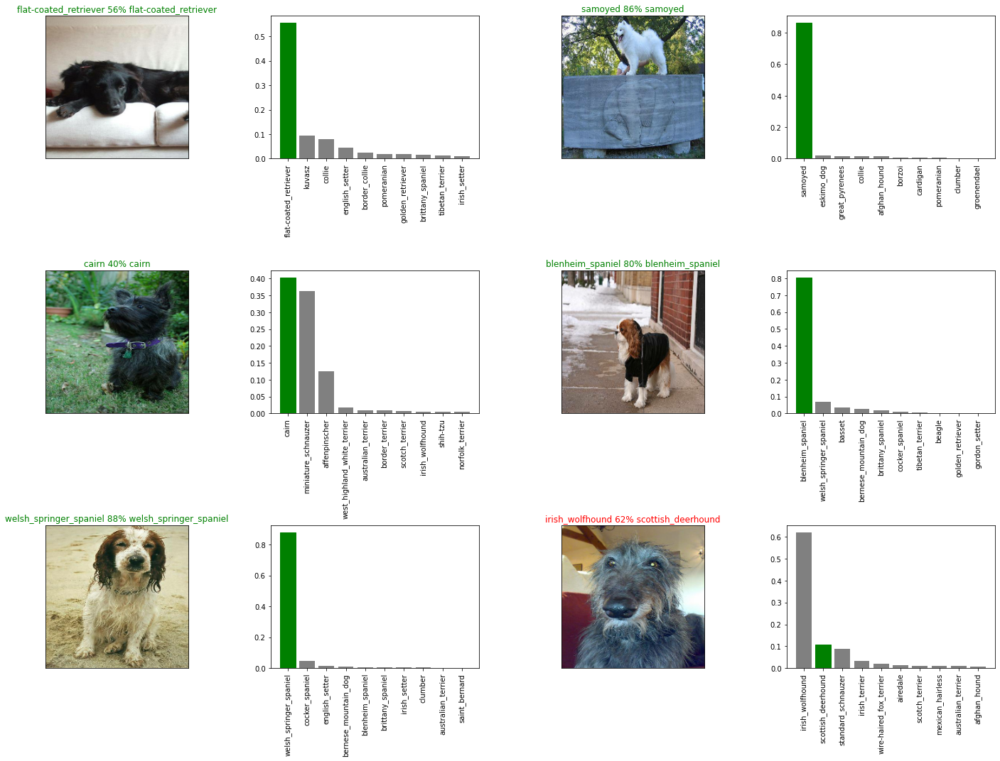

In [ ]:
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols

plt.figure(figsize = (10*num_cols, 5*num_rows))

## ploting figures
for i in range(num_images):

    ## Ploting preds
    plt.subplot(num_rows, 2 * num_cols, 2*i+1)

    plot_pred(prediction_probabilities = predictions,
              labels = val_labels,
              images = val_images,
              n = i + i_multiplier)


    ## Ploting pred_conf
    plt.subplot(num_rows, 2 * num_cols, 2*i+2)

    plot_pred_conf(prediction_probabilities = predictions,
              labels = val_labels,
              n = i + i_multiplier)


## Plot everything side by side
plt.tight_layout(h_pad = 1.0)
plt.show()



## Saving and loading a trained model

In [ ]:
## Create a function to save a model
def save_model(model, suffix = None):
    '''
    Save a given model in a model's directory and appends a suffix (string)
    '''

    ## Create a model directory pathname with current time
    modeldir = os.path.join("drive/MyDrive/datasets/courses/Dog-Vision/models",
                            datetime.datetime.now().strftime("%d%m%Y-%H%M%s"))
    model_path = modeldir + '-' + suffix + '.h5' # save format of model
    print(f'Saving model to: {model_path}...')

    model.save(model_path)

    return model_path

In [ ]:
## Create a function to load a model
def load_model(model_path):
    '''
    Loads a save model from a specified path
    '''

    print(f'Loading saved model from {model_path}')
    model = tf.keras.models.load_model(model_path,
                                       custom_objects = {'KerasLayer': hub.KerasLayer})

    return model

In [ ]:
## Save our model trained on 1000 images
save_model(model, suffix = "1000-images-mobilenetv2-Ada")

Saving model to: drive/MyDrive/datasets/courses/Dog-Vision/models/03102021-21041633295045-1000-images-mobilenetv2-Ada.h5...


'drive/MyDrive/datasets/courses/Dog-Vision/models/03102021-21041633295045-1000-images-mobilenetv2-Ada.h5'

In [ ]:
loaded_1000_image_model = load_model('drive/MyDrive/datasets/courses/Dog-Vision/models/03102021-17471633283278-1000-images-mobilenetv2-Adam.h5')

Loading saved model from drive/MyDrive/datasets/courses/Dog-Vision/models/03102021-17471633283278-1000-images-mobilenetv2-Adam.h5


### Making sure the loaded model that we saved works

In [ ]:
## Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 7s 1s/step - loss: 1.3012 - accuracy: 0.6700


[1.3011894226074219, 0.6700000166893005]

In [ ]:
## Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 8s 990ms/step - loss: 1.2433 - accuracy: 0.6850


[1.2433358430862427, 0.6850000023841858]

## Training the model with the full data

In [ ]:
len(x), len(y)

(10222, 10222)

In [ ]:
print(x[0])
print('\n\n')
print(y[0])

drive/MyDrive//datasets/courses/Dog-Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg



[False False False False False False False False False False False False
 False False False False False False False  True False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False]


In [ ]:
## Create a data batch with the full dataset
full_data = create_data_batches(x, y)
full_data

Creating training data batches


<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
## Creating a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
## Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

## No validation set whem training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor = 'accuracy',
                                                             patience = 3)

### NOTE 1: Running the cell bellow will take a little while

Maybe up to 30 mins for the first epoch, because the GPU we're using in the runtime has to load all of the images into memory

It is import to make sure that everything is working, so it's a good idea testing with part of the data before testing with the full data. Imagine training the model for a week and discover that it is not working

In [ ]:
'''
## Fit the full model to the full data
full_model.fit(x = full_data,
               epochs = NUM_EPOCHS,
               callbacks = [full_model_tensorboard, full_model_early_stopping])
'''

'\n## Fit the full model to the full data\nfull_model.fit(x = full_data,\n               epochs = NUM_EPOCHS,\n               callbacks = [full_model_tensorboard, full_model_early_stopping])\n'

In [ ]:
## Saving the trained model
#save_model(full_model, suffix = 'full-image-set-mobilenetv2-Adam')

In [ ]:
## Load the trained model
loaded_full_model = load_model('drive/MyDrive/datasets/courses/Dog-Vision/models/03102021-19001633287613-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from drive/MyDrive/datasets/courses/Dog-Vision/models/03102021-19001633287613-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test dataset

Since our model has been trained on images in the form of tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily, we created a "create_data_batches()" earlier which can take a list of filenames as input and convert them into tensor batches.

To make predictions on the dataset, we'll:
* Get the test image filenames
* Convert the filenames into test data batches using "create_data_batches() and setting the "test_data" paramethers to "true" (since the test data don't have labels)
* Make a prediction array by passing the test batches to the "predict()" method called on our model

In [ ]:
## Load test image filenames
'''
Listdir get all the file names in a folder
'''
test_path = "drive/MyDrive/datasets/courses/Dog-Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/datasets/courses/Dog-Vision/test/e7feb64da6aae1ef8e62453f6660d0c5.jpg',
 'drive/MyDrive/datasets/courses/Dog-Vision/test/e7b357150635c250757363718e4dae86.jpg',
 'drive/MyDrive/datasets/courses/Dog-Vision/test/e7b608110b0e29120d8740f37e85f3d0.jpg',
 'drive/MyDrive/datasets/courses/Dog-Vision/test/e800b6c8d2904e205d67ada800907762.jpg',
 'drive/MyDrive/datasets/courses/Dog-Vision/test/e7a1b7a42db97df750aeae212a02d9c4.jpg',
 'drive/MyDrive/datasets/courses/Dog-Vision/test/e7afb35b8252782013a6700e28e327fa.jpg',
 'drive/MyDrive/datasets/courses/Dog-Vision/test/e7ce78e874945f182a4f5149aa505b09.jpg',
 'drive/MyDrive/datasets/courses/Dog-Vision/test/e7e9624f2a2e61ab187358f5968bfde8.jpg',
 'drive/MyDrive/datasets/courses/Dog-Vision/test/e7afcce6e45858fc3b294cc5c0b15a53.jpg',
 'drive/MyDrive/datasets/courses/Dog-Vision/test/e7b4b0e7d7d76f8dbd64920f34443b25.jpg']

In [ ]:
## Create test data batch
test_data = create_data_batches(test_filenames, test_data = True)
test_data

Creating test data batches


<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

### NOTE 2: Running the cell bellow will take a little while
Calling "predict()" on our full model and passing it the test data batch will take a long time to run (about 1 hour)

In [ ]:
## Make predictions on test data batch using loaded full model
#test_predictions = loaded_full_model.predict(test_data,
#                                             verbose = 1)

IndentationError: ignored

In [ ]:
## Save predictions (numpy array) to csv file (for acess later)
#np.savetxt("drive/MyDrive/datasets/courses/Dog-Vision/preds_array.csv", test_predictions, delimiter = ",")

In [ ]:
## Load predictions (numpy array) from csv file
test_predictions = np.loadtxt('drive/MyDrive/datasets/courses/Dog-Vision/preds_array.csv', delimiter = ',')

In [ ]:
test_predictions[:10]

array([[4.03956733e-07, 3.81062018e-05, 4.61470284e-09, ...,
        2.64600750e-08, 3.52502170e-08, 9.19190425e-05],
       [1.11139252e-05, 1.84653376e-10, 6.97470659e-09, ...,
        4.35278423e-07, 9.70659197e-09, 1.90845440e-05],
       [5.55191484e-08, 8.40248227e-13, 3.40899531e-10, ...,
        3.98510669e-11, 1.72449260e-11, 2.66317635e-09],
       ...,
       [1.14849916e-08, 7.50551774e-11, 3.35288880e-10, ...,
        3.14686499e-10, 1.15272536e-09, 4.01868816e-10],
       [9.87831801e-02, 1.95131324e-08, 2.15956669e-10, ...,
        2.21975383e-10, 1.90753688e-08, 1.78325934e-07],
       [7.83363818e-10, 1.35426920e-10, 1.54481530e-08, ...,
        3.27732579e-07, 1.00565585e-05, 3.85606711e-08]])

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset for kaggle's submission

Looking at the kaggle sample submission, we find that in it wants our models
prediction probability outputs in a dataframe with an ID and a column for each different dog breed.

To get the data in this format, we will:
* Create a pandas dataframe with an ID column as well a column for each dog breed
* Add data to ID column by extracting the test image ID's from their filepaths
* Add data (the prediction probabilities) to each dog breed columns
* Export the dataframe as a CSV to submit to kaggle.

In [ ]:
list(unique_breeds)

['affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier',
 'appenzeller',
 'australian_terrier',
 'basenji',
 'basset',
 'beagle',
 'bedlington_terrier',
 'bernese_mountain_dog',
 'black-and-tan_coonhound',
 'blenheim_spaniel',
 'bloodhound',
 'bluetick',
 'border_collie',
 'border_terrier',
 'borzoi',
 'boston_bull',
 'bouvier_des_flandres',
 'boxer',
 'brabancon_griffon',
 'briard',
 'brittany_spaniel',
 'bull_mastiff',
 'cairn',
 'cardigan',
 'chesapeake_bay_retriever',
 'chihuahua',
 'chow',
 'clumber',
 'cocker_spaniel',
 'collie',
 'curly-coated_retriever',
 'dandie_dinmont',
 'dhole',
 'dingo',
 'doberman',
 'english_foxhound',
 'english_setter',
 'english_springer',
 'entlebucher',
 'eskimo_dog',
 'flat-coated_retriever',
 'french_bulldog',
 'german_shepherd',
 'german_short-haired_pointer',
 'giant_schnauzer',
 'golden_retriever',
 'gordon_setter',
 'great_dane',
 'great_pyrenees',
 'greater_swiss_mountain_dog',
 'groenendael',


In [ ]:
## Create a pandas dataframe with empty columns
preds_df = pd.DataFrame(columns = ['Id'] + list(unique_breeds))
preds_df

,Id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
## Splits the last part of the string
os.path.splitext(test_filenames[0])

('drive/MyDrive/datasets/courses/Dog-Vision/test/e7feb64da6aae1ef8e62453f6660d0c5',
 '.jpg')

In [ ]:
## Append test image ID's to prediction's dataframe
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
test_ids[:10]


['e7feb64da6aae1ef8e62453f6660d0c5',
 'e7b357150635c250757363718e4dae86',
 'e7b608110b0e29120d8740f37e85f3d0',
 'e800b6c8d2904e205d67ada800907762',
 'e7a1b7a42db97df750aeae212a02d9c4',
 'e7afb35b8252782013a6700e28e327fa',
 'e7ce78e874945f182a4f5149aa505b09',
 'e7e9624f2a2e61ab187358f5968bfde8',
 'e7afcce6e45858fc3b294cc5c0b15a53',
 'e7b4b0e7d7d76f8dbd64920f34443b25']

In [ ]:
preds_df['Id'] = test_ids
preds_df

,Id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e7feb64da6aae1ef8e62453f6660d0c5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e7b357150635c250757363718e4dae86,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e7b608110b0e29120d8740f37e85f3d0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e800b6c8d2904e205d67ada800907762,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e7a1b7a42db97df750aeae212a02d9c4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10352,07ff89277767ddc115adeee8a6f0ceec,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10353,07ce92f83426286eaba1b9459d305fca,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10354,0821ea02386d4a714d7b6e39ee5e66e8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

In [ ]:
## Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df

,Id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e7feb64da6aae1ef8e62453f6660d0c5,4.03957e-07,3.81062e-05,4.6147e-09,3.97891e-08,3.13307e-07,3.1085e-07,6.57163e-07,2.88936e-07,8.84692e-09,1.10459e-07,2.22091e-09,1.40544e-05,5.60973e-07,0.000845138,5.20105e-07,2.47332e-07,5.08933e-07,2.26727e-09,3.43109e-07,1.96481e-08,4.21095e-08,2.72646e-06,4.6532e-06,3.64439e-06,6.35795e-06,9.82298e-06,2.84312e-08,6.29301e-09,3.21509e-08,0.00163908,0.728032,6.85652e-07,0.00170942,0.000795175,1.49485e-09,6.01709e-08,4.41909e-08,5.48281e-08,1.05344e-08,...,7.87639e-08,2.17707e-05,9.53732e-09,3.81748e-07,0.00112338,0.0367997,3.0245e-06,0.192794,4.17712e-07,2.5008e-06,2.63001e-07,2.69161e-07,4.65235e-06,1.22113e-06,4.07582e-05,2.1704e-07,2.89763e-10,1.56205e-08,2.24671e-07,6.31782e-05,3.03532e-07,4.78504e-07,2.23715e-08,1.19451e-06,9.65112e-06,1.16264e-05,1.35259e-08,4.9472e-05,0.0013822,2.63447e-07,0.00201729,9.26879e-08,2.67508e-06,6.35123e-08,2.1942e-07,4.24177e-08,4.89595e-09,2.64601e-08,3.52502e-08,9.1919e-05
1,e7b357150635c250757363718e4dae86,1.11139e-05,1.84653e-10,6.97471e-09,1.60194e-06,2.5675e-07,8.22881e-10,0.000227097,8.63849e-07,3.64974e-08,7.99746e-08,2.25663e-09,5.98842e-07,1.3758e-08,3.43129e-09,5.33736e-10,3.5954e-08,3.97206e-08,0.000601597,4.18103e-10,1.38492e-07,6.55593e-06,4.53732e-09,5.30706e-07,2.26805e-09,3.09507e-08,5.69257e-09,0.954287,5.07498e-07,6.78886e-07,1.19855e-05,1.25382e-06,1.7552e-08,5.87145e-08,1.33198e-08,7.58678e-10,9.64101e-06,6.868e-07,1.31678e-07,2.28483e-09,...,4.59198e-05,0.0288757,1.16236e-10,1.12849e-08,5.2522e-07,5.16531e-09,3.32667e-06,3.69502e-05,3.02449e-07,2.42742e-08,7.51884e-09,9.23396e-10,2.73771e-11,1.34277e-09,2.71389e-07,0.000168531,1.31881e-05,7.81589e-06,7.80258e-07,1.49195e-11,2.01793e-07,5.124e-08,4.15549e-06,5.57369e-06,9.85136e-06,5.20779e-08,2.54065e-05,1.58554e-07,8.4296e-12,9.0763e-08,7.73215e-05,0.00927275,1.79148e-07,1.19668e-07,1.40601e-08,1.58555e-07,0.000504113,4.35278e-07,9.70659e-09,1.90845e-05
2,e7b608110b0e29120d8740f37e85f3d0,5.55191e-08,8.40248e-13,3.409e-10,3.47271e-11,2.88948e-10,1.38338e-10,2.6246e-12,3.17969e-10,5.1156e-13,4.11946e-10,3.00521e-12,7.8688e-11,2.28816e-09,5.98079e-11,4.74522e-11,1.32916e-10,3.87441e-09,3.75159e-08,1.36697e-11,2.17165e-07,1.37973e-10,6.18987e-10,1.14718e-06,1.74585e-10,2.75377e-11,2.14752e-07,3.82103e-09,9.29194e-12,8.70484e-11,4.40145e-09,1.85934e-08,6.87361e-12,1.29835e-11,1.89712e-11,1.00165e-10,3.42753e-12,7.72148e-10,4.11166e-11,8.0404e-10,...,3.29918e-06,8.80801e-12,4.57291e-11,1.08476e-10,1.03222e-11,3.88748e-05,4.59131e-13,4.43616e-10,0.999956,4.41237e-09,1.16624e-10,4.00012e-08,3.96868e-09,6.06181e-12,4.91777e-13,4.56389e-09,3.37472e-10,1.6661e-11,4.74859e-10,4.36196e-13,1.32348e-07,2.84235e-08,3.81875e-09,2.36322e-10,6.62764e-10,1.2338e-11,4.40517e-11,1.68412e-10,2.34171e-09,1.22067e-11,1.18553e-11,5.07149e-10,8.90236e-12,9.16606e-10,4.11805e-10,2.84454e-11,1.50764e-10,3.98511e-11,1.724

In [ ]:
## Save our predictions dataframe to CSV for submission to kaggle
preds_df.to_csv('drive/MyDrive/datasets/courses/Dog-Vision/full_model_predictions_submission_1_mobilenetV2.csv', index = False)

## Making predictions on custom images

To make predictions on custom images, we will:
* Get filepaths of our own images
* Turn the filepaths into data batches using "create_data_batch()". And since our custom images wont have labels, we set the "test_data" paramether to "True".
* Pass the custom image data batch to our model's "predict()" method
* Convert the prediction output probabilities to predictions labels.
* Compare the prediction labels to custom images.

In [ ]:
## Get custom images filepaths
custom_path = 'drive/MyDrive/datasets/courses/Dog-Vision/custom_images/'
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]
custom_image_paths

['drive/MyDrive/datasets/courses/Dog-Vision/custom_images/pincher_do_mal.jpeg']

In [ ]:
## Creating batches
custom_data = create_data_batches(custom_image_paths, test_data = True)
custom_data

Creating test data batches


<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [ ]:
## Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)
custom_preds

array([[1.22082344e-08, 4.68746732e-13, 1.13367304e-09, 3.27970602e-11,
        1.56644600e-10, 6.01760516e-11, 1.28521971e-10, 1.96652010e-08,
        1.79357874e-12, 7.40177768e-08, 8.30813682e-11, 2.94849296e-13,
        4.67857864e-10, 1.49714421e-10, 5.36091449e-11, 3.67681385e-10,
        3.13302495e-10, 2.05948769e-09, 2.82674296e-12, 1.75913412e-03,
        1.46608732e-11, 2.76807843e-09, 2.31344643e-06, 1.39564549e-11,
        2.87548869e-12, 4.43262657e-12, 6.46521201e-08, 8.67801297e-09,
        8.84586295e-13, 9.97394204e-01, 1.37914707e-10, 5.25266202e-12,
        8.11512579e-10, 6.89790239e-11, 2.44525164e-11, 5.12752618e-10,
        3.10016590e-09, 1.46508601e-08, 4.96095803e-11, 1.15593063e-10,
        1.77767371e-12, 2.42364527e-12, 1.64107564e-11, 7.35657701e-10,
        2.25559502e-11, 3.61708109e-04, 3.31198180e-10, 1.51731561e-11,
        1.91753536e-12, 1.19733216e-11, 2.93183089e-10, 3.68811995e-11,
        1.06412518e-11, 7.40853601e-10, 6.28060483e-13, 6.028202

In [ ]:
## Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['chihuahua']

In [ ]:
## Get custom images (our unbatchify() function wont work since there arent labels)
custom_images = []

## Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
    custom_images.append(image)

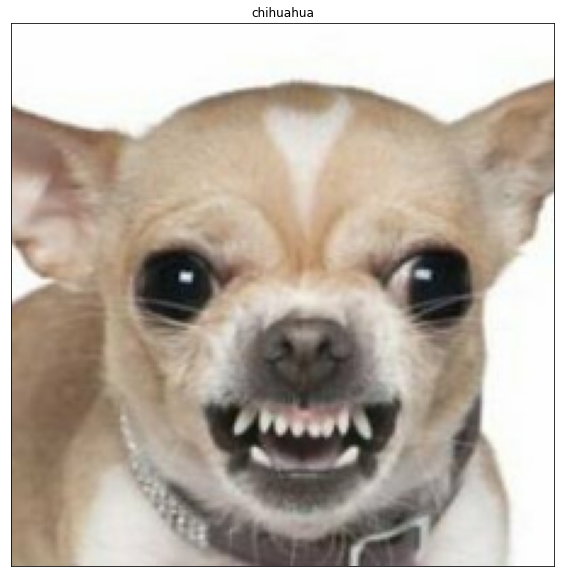

In [ ]:
## Check custom image predictions
plt.figure(figsize = (10,10))

for i, image in enumerate(custom_images):
    plt.subplot(1, 1, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.title(custom_pred_labels[i])
    plt.imshow(image)
